# Julia ModelingToolkit Implementation of ADM1: Demo

In this demo, we will demonstrate how to use the julia JMTK-ADM1 model

## Set Up Environment
This model requires the following packages: 
- ModelingToolkit.jl v8.15.1
- DifferentialEquations.jl v7.1.0
- Symbolics.jl v4.8.3
- DelimitedFiles.jl
- IfElse.jl
- LinearAlgebra.jl

In [1]:
#Import Packages
using DifferentialEquations,Plots,LinearAlgebra,ModelingToolkit,IfElse
using DelimitedFiles
using Symbolics:@register_symbolic,scalarize

#Import Main Model
include("ADM1_MTK_Dynamic_base.jl");

 66.918524 seconds (571.93 M allocations: 22.213 GiB, 7.91% gc time, 69.89% compilation time)


retcode: Success
Interpolation: 1st order linear
t: 8641-element Vector{Float64}:
  0.0
  0.010416666666666666
  0.020833333333333332
  0.03125
  0.041666666666666664
  0.052083333333333336
  0.0625
  0.07291666666666667
  0.08333333333333333
  0.09375
  0.10416666666666667
  0.11458333333333333
  0.125
  ⋮
 89.88541666666667
 89.89583333333333
 89.90625
 89.91666666666667
 89.92708333333333
 89.9375
 89.94791666666667
 89.95833333333333
 89.96875
 89.97916666666667
 89.98958333333333
 90.0
u: 8641-element Vector{Vector{Float64}}:
 [0.012394, 0.0055432, 0.10741, 0.012333, 0.014003, 0.017584, 0.089315, 0.05549, 0.095149, 0.094468  …  0.67724, 0.28484, 17.2162, 1.08e-47, 0.0052101, 1.1e-5, 1.6535, 0.01354, 5.456357571295498e-8, 2.50549750150198e-7]
 [0.01238880328013094, 0.005522867214220944, 0.1074046540855334, 0.012332421165657314, 0.01400247057366636, 0.017584798064300872, 0.08931843441898893, 0.05549213672601148, 0.09515447958295063, 0.09447384898291444  …  0.6772832767310063, 0.2848

## Initialize Model Parameters & Variables

Set up parameters in local name space

In [2]:
#Define Operating Parameters
@parameters V_liq, V_gas,T_op;
#Define Physical Conditions
@parameters P_atm, R, p_gas_h2o;
#Define Carbon Stoichiometry Parameters
@parameters C_xc,C_sI,C_ch,C_pr,C_li,C_xI,C_su,C_aa,C_fa,C_bu,C_pro,C_ac,C_bac,C_va,C_ch4;
#Define yields of product on substrate
@parameters f_sI_xc,f_xI_xc,f_ch_xc,f_pr_xc,f_li_xc,f_fa_li,f_h2_su,f_bu_su,f_pro_su,f_ac_su,f_h2_aa,f_va_aa,f_bu_aa,f_pro_aa,f_ac_aa;
#Define Nitrogen Stoichiometry Parameters
@parameters N_xc,N_I,N_aa,N_bac;
#Define yields of biomass on substrate
@parameters Y_su,Y_aa,Y_fa,Y_c4,Y_pro,Y_ac,Y_h2;
#Define kinetic,biochemical,and physiochemical parameters
@parameters k_dis,k_hyd_ch,k_hyd_pr,k_hyd_li,k_dec_all,k_m_su,k_m_aa,k_m_fa,k_m_c4,k_m_pro,k_m_ac,k_m_h2,k_p,k_La;
@parameters K_S_IN,K_S_su,K_S_aa,K_S_fa,K_I_H2_fa,K_S_c4,K_I_H2_c4,K_S_pro,K_I_H2_pro,K_S_ac,K_I_NH3,K_S_h2,K_W,K_a_va,K_a_bu,K_a_pro,K_a_ac,K_a_co2,K_a_IN,K_H_co2,K_H_ch4,K_H_h2;
#Define pH limits
@parameters pH_UL_aa,pH_LL_aa,pH_UL_ac,pH_LL_ac,pH_UL_h2,pH_LL_h2;

In [3]:
#Specify parameter values -> Taken from Rosen 2006 appendix
#Size parameters
size_param=[V_liq=>3400.0,V_gas=>300.0];
#Operational parameters
op_param=[P_atm=>1.013,R=>0.083145,T_op=>308.15,p_gas_h2o=>0.0313*exp(5290*(1/298.15-1/308.15))];
#Carbon stoich parameters
C_param=[C_xc=>0.02786,C_sI=>0.03,C_ch=>0.0313,C_pr=>0.03,C_li=>0.022,C_xI=>0.03,C_su=>0.0313,C_aa=>0.03,C_fa=>0.0217,C_bu=>0.025,C_pro=>0.0268,C_ac=>0.0313,C_bac=>0.0313,C_va=>0.024,C_ch4=>0.0156];
#Yields of product on substrate
f_param=[f_sI_xc=>0.1,f_xI_xc=>0.2,f_ch_xc=>0.20,f_pr_xc=>0.20,f_li_xc=>0.3,f_fa_li=>0.95,f_h2_su=>0.19,f_bu_su=>0.13,f_pro_su=>0.27,f_ac_su=>0.41,f_h2_aa=>0.06,f_va_aa=>0.23,f_bu_aa=>0.26,f_pro_aa=>0.05,f_ac_aa=>0.40];
#Nitrogen stoich parameters
N_param=[N_xc=>0.0376/14,N_I=>.06/14,N_aa=>0.007,N_bac=>0.08/14];
#Yields of biomass on substrate
Y_parama=[Y_su=>0.1,Y_aa=>0.08,Y_fa=>0.06,Y_c4=>0.06,Y_pro=>0.04,Y_ac=>0.05,Y_h2=>0.06];
#Kinetic parameters
k_param=[k_dis=>0.5,k_hyd_ch=>10.0,k_hyd_pr=>10.0,k_hyd_li=>10.0,k_dec_all=>0.02,k_m_su=>30.0,k_m_aa=>50.0,k_m_fa=>6.0,k_m_c4=>20.0,k_m_pro=>13.0,k_m_ac=>8.0,k_m_h2=>35.0,k_p=>5e4,k_La=>200.0];
K_param=[K_S_IN=>1e-4,K_S_su=>0.5,K_S_aa=>0.3,K_S_fa=>0.4,
K_I_H2_fa=>5e-6,K_S_c4=>0.2,K_I_H2_c4=>1e-5,K_S_pro=>0.1,K_I_H2_pro=>3.5e-6,K_S_ac=>0.15,K_I_NH3=>0.0018,K_S_h2=>7e-6,
K_W=>(10^-14)*exp((55900/(0.083145*100))*((1/298.15)-(1/308.15))),K_a_va=>10^-4.86,K_a_bu=>10^-4.82,K_a_pro=>10^-4.88,K_a_ac=>10^-4.76,
K_a_co2=>(10^-6.35)*exp((7646/(0.083145*100))*((1/298.15)-(1/308.15))),K_a_IN=>(10^-9.25)*exp((51965/(0.083145*100))*((1/298.15)-(1/308.15))),K_H_co2=>0.035*exp((-19410/(0.083145*100))*((1/298.15)-(1/308.15))),K_H_ch4=>0.0014*exp((-14240/(0.083145*100))*((1/298.15)-(1/308.15))),K_H_h2=>7.8e-4*exp((-4180/(0.083145*100))*((1/298.15)-(1/308.15)))];
#pH limits
pH_param=[pH_UL_aa=>5.5,pH_LL_aa=>4.0,pH_UL_ac=>7.0,pH_LL_ac=>6.0,pH_UL_h2=>6.0,pH_LL_h2=>5.0];
#Collect all parameters into total parameter array
param_val=[size_param; op_param; C_param; f_param; N_param; Y_parama; k_param; K_param; pH_param]

89-element Vector{Pair{Num, Float64}}:
     V_liq => 3400.0
     V_gas => 300.0
     P_atm => 1.013
         R => 0.083145
      T_op => 308.15
 p_gas_h2o => 0.05566774507499009
      C_xc => 0.02786
      C_sI => 0.03
      C_ch => 0.0313
      C_pr => 0.03
      C_li => 0.022
      C_xI => 0.03
      C_su => 0.0313
           ⋮
    K_a_ac => 1.7378008287493764e-5
   K_a_co2 => 4.937073397534363e-7
    K_a_IN => 1.1102866527080678e-9
   K_H_co2 => 0.027146692900075386
   K_H_ch4 => 0.0011619027336733539
    K_H_h2 => 0.0007384654293536963
  pH_UL_aa => 5.5
  pH_LL_aa => 4.0
  pH_UL_ac => 7.0
  pH_LL_ac => 6.0
  pH_UL_h2 => 6.0
  pH_LL_h2 => 5.0

Set up variables in local name space

In [4]:
#Define state variables (all functions of time)
@variables t, S_su(t),S_aa(t),S_fa(t),S_va(t),S_bu(t),S_pro(t),S_ac(t),S_h2(t),
S_ch4(t),S_IC(t),S_IN(t),S_I(t),X_c(t),X_ch(t),X_pr(t),X_li(t),
X_su(t),X_aa(t),X_fa(t),X_c4(t),X_pro(t),X_ac(t),X_h2(t),X_I(t),
S_cat(t),S_an(t),S_H_plus(t),S_gas_h2(t),S_gas_ch4(t),S_gas_co2(t);
#Define auxiliary variables
@variables p_gas_h2(t), p_gas_ch4(t), p_gas_co2(t), P_gas(t), q_gas(t), s_va_minus(t), s_bu_minus(t), s_pro_minus(t), s_ac_minus(t), s_hco3_minus(t), s_nh3(t), s_nh4_plus(t),
I_pH_aa(t),I_pH_ac(t),I_pH_h2(t),I_IN_lim(t),I_h2_fa(t),I_h2_c4(t),I_h2_pro(t),I_nh3(t),I_5_6(t),I_7(t),I_8_9(t),I_10(t),I_11(t),I_12(t),subsum(t),pH(t);
@variables s_1(t),s_2(t),s_3(t),s_4(t),s_5(t),s_6(t),s_7(t),s_8(t),s_9(t),s_10(t),s_11(t),s_12(t),s_13(t);
@variables ρ_bc_1(t),ρ_bc_2(t),ρ_bc_3(t),ρ_bc_4(t),ρ_bc_5(t),ρ_bc_6(t),ρ_bc_7(t),ρ_bc_8(t),ρ_bc_9(t),ρ_bc_10(t),
ρ_bc_11(t),ρ_bc_12(t),ρ_bc_13(t),ρ_bc_14(t),ρ_bc_15(t),ρ_bc_16(t),ρ_bc_17(t),ρ_bc_18(t),ρ_bc_19(t);
@variables ρ_T_1(t),ρ_T_2(t),ρ_T_3(t)
@variables reac_1(t),reac_2(t),reac_3(t),reac_4(t),reac_5(t),reac_6(t),reac_7(t),reac_8(t),reac_9(t),reac_10(t), reac_11(t),reac_12(t),
reac_13(t),reac_14(t),reac_15(t),reac_16(t),reac_17(t),reac_18(t),reac_19(t),reac_20(t),reac_21(t),reac_22(t),reac_23(t),reac_24(t);
#Define Influent Variables
@variables S_su_in(t),S_aa_in(t),S_fa_in(t),S_va_in(t),S_bu_in(t),S_pro_in(t),S_ac_in(t),S_h2_in(t),S_ch4_in(t),S_IC_in(t),S_IN_in(t),S_I_in(t),
X_c_in(t),X_ch_in(t),X_pr_in(t),X_li_in(t),X_su_in(t),X_aa_in(t),X_fa_in(t),X_c4_in(t),X_pro_in(t),X_ac_in(t),X_h2_in(t),X_I_in(t),S_cat_in(t),S_an_in(t);
@variables q(t);
#Register differential with respect to time t
D = Differential(t);


## Instatiate and Run ADM1 Model
Register ADM1 equations in modeling toolkit and run structural simplifications

In [5]:
@named ADM1_sys = ADM1_factory();
ADM1_simp = structural_simplify(ADM1_sys)

Model ADM1_sys with 30 equations
States (30):
  S_su(t)
  S_aa(t)
  S_fa(t)
  S_va(t)
  S_bu(t)
  S_pro(t)
⋮
Parameters (89):
  R
  T_op
  p_gas_h2o
  P_atm
  k_p
  K_a_va
⋮
Incidence matrix:30×58 SparseArrays.SparseMatrixCSC{Num, Int64} with 256 stored entries:
⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⣑⣄⣀⠀⢸⠀⠑⢍⣢⣀⢀⠀⢀⠀⣧
⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠿⠾⠷⣄⢸⠀⠀⠸⠷⠷⣴⠀⠰⡀⣿
⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⠀⠀⠛⠛⠛⠃⠙⢼⠉⢙⣛⣛⣛⠀⠘⠈⠛
⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠀⡀⠀⠀⠀⢀⠸⠑⢄⠀⠀⠀⠀⠀⠀⡀
⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠬⠦⢤⠀⢸⠀⠀⠠⠵⢤⠠⠀⠠⠀⣷
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠀⠀⠁⠘⠠⠀⠀⠀⠀⠑⢄⠀⠀⠓
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠑⢄⠀⠀⠀⠠⡀⠀⠀⠀⠀⠀⠀⠀⢱⣶⡐
⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠀⠒⠚⠛⠁⠙⠀⠀⠐⠒⠒⠐⠈⠑⠀⠓

Set up simulation time horizon and initial conditions

In [6]:
#Define simulation time
tspan = (0.0,90.0)
#Provide initial conditions from PyADM1 model implementation
u0_d=[S_su=>0.012394,S_aa=>0.0055432,S_fa=>0.10741,S_va=>0.012333,
S_bu=>0.014003,S_pro=>0.017584,S_ac=>0.089315,S_h2=>2.51E-07,S_ch4=>0.05549,
S_IC=>0.095149,S_IN=>0.094468,S_I=>0.13087,X_c=>0.10792,X_ch=>0.020517,
X_pr=>0.08422,X_li=>0.043629,X_su=>0.31222,X_aa=>0.93167,X_fa=>0.33839,
X_c4=>0.33577,X_pro=>0.10112,X_ac=>0.67724,X_h2=>0.28484,X_I=>17.2162,S_cat=>1.08E-47,
S_an=>0.0052101,S_H_plus=>(10^-7.26280735729526),S_gas_h2=>1.10E-05,S_gas_ch4=>1.6535,S_gas_co2=>0.01354];

Create ODEProblem for DifferentialEquations.jl, set tolerance, and solve problem

In [7]:
#Specify ODE Problem for modeling toolkit / differentialequations.jl
prob = ODEProblem(ADM1_simp,u0_d,tspan,param_val)
#Solve problem using RadauIIA5 solver for DAE with mass matrix
#This problem generally requires a 4th or 5th order solver - RadauIIA5 demonstrated the best efficiency thus far 
tol=1e-6; #1e-6 used for low tolerance, quick simulation for demo
@time sol = solve(prob, RadauIIA5(),abstol=tol,reltol=tol,saveat=(1/96))

  1.957927 seconds (39.79 M allocations: 628.713 MiB, 8.35% gc time)


retcode: Success
Interpolation: 1st order linear
t: 8641-element Vector{Float64}:
  0.0
  0.010416666666666666
  0.020833333333333332
  0.03125
  0.041666666666666664
  0.052083333333333336
  0.0625
  0.07291666666666667
  0.08333333333333333
  0.09375
  0.10416666666666667
  0.11458333333333333
  0.125
  ⋮
 89.88541666666667
 89.89583333333333
 89.90625
 89.91666666666667
 89.92708333333333
 89.9375
 89.94791666666667
 89.95833333333333
 89.96875
 89.97916666666667
 89.98958333333333
 90.0
u: 8641-element Vector{Vector{Float64}}:
 [0.012394, 0.0055432, 0.10741, 0.012333, 0.014003, 0.017584, 0.089315, 0.05549, 0.095149, 0.094468  …  0.67724, 0.28484, 17.2162, 1.08e-47, 0.0052101, 1.1e-5, 1.6535, 0.01354, 5.456356948847836e-8, 2.5054972167573157e-7]
 [0.012389225296226346, 0.0055241110485187974, 0.1074053114434107, 0.012332516866277517, 0.014002580548782664, 0.017584791673682057, 0.08931844264681853, 0.055492103146798165, 0.09515427647062061, 0.09447363589372304  …  0.6772816827088747, 

## Postprocessing and Visualization

In [8]:
dt=(1/96);
t_end=90;

Digester pH Animation

┌ Info: Saved animation to 
│   fn = P:\AnaerobicDigester\ProductionModels\JMTK_ADM1\demo\pH_anim.gif
└ @ Plots C:\Users\stm16109\.julia\packages\Plots\E2187\src\animation.jl:126


Plots.AnimatedGif("P:\\AnaerobicDigester\\ProductionModels\\JMTK_ADM1\\demo\\pH_anim.gif")
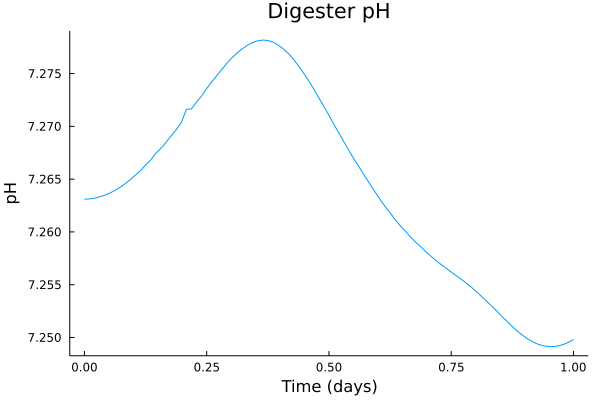

In [9]:
pH_anim = @animate for i= 1:t_end
    plot(0:dt:i,sol_hr[pH][1:Int(i ÷ dt)+1],xlabel="Time (days)",ylabel="pH",title="Digester pH",legend=false,grid=false)
end
gif(pH_anim,"pH_anim.gif",fps=10)

Digester Methane Production Animation

┌ Info: Saved animation to 
│   fn = P:\AnaerobicDigester\ProductionModels\JMTK_ADM1\demo\ch4_anim.gif
└ @ Plots C:\Users\stm16109\.julia\packages\Plots\E2187\src\animation.jl:126


Plots.AnimatedGif("P:\\AnaerobicDigester\\ProductionModels\\JMTK_ADM1\\demo\\ch4_anim.gif")
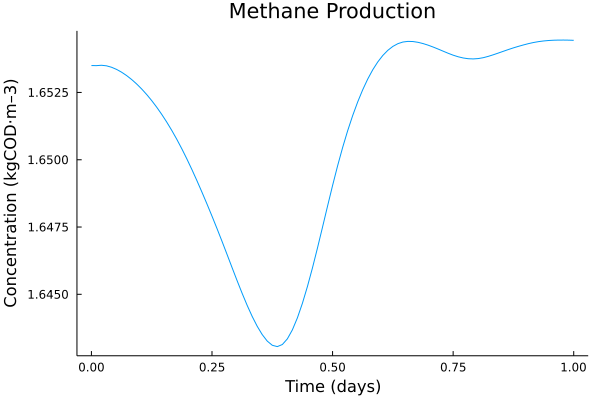

In [10]:
ch4_anim = @animate for i= 1:t_end
    plot(0:dt:i,sol_hr[S_gas_ch4][1:Int(i ÷ dt)+1],xlabel="Time (days)",ylabel="Concentration (kgCOD·m–3)",title="Methane Production",legend=false,grid=false)
end
gif(ch4_anim,"ch4_anim.gif",fps=10)

┌ Info: Saved animation to 
│   fn = P:\AnaerobicDigester\ProductionModels\JMTK_ADM1\demo\c_anim.gif
└ @ Plots C:\Users\stm16109\.julia\packages\Plots\E2187\src\animation.jl:126


Plots.AnimatedGif("P:\\AnaerobicDigester\\ProductionModels\\JMTK_ADM1\\demo\\c_anim.gif")
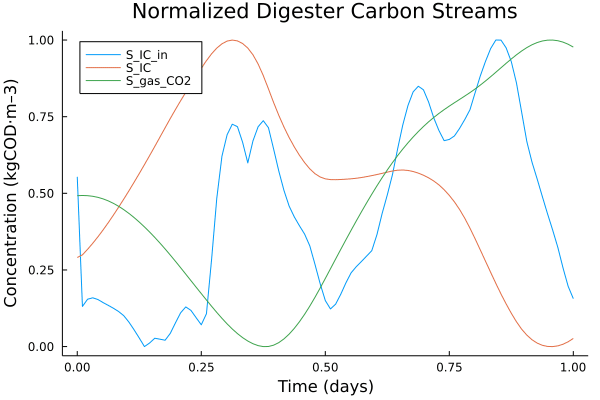

In [11]:
c_anim = @animate for i= 1:t_end
    plot(0:dt:i,[normalize(sol_hr[S_IC_in][1:Int(i ÷ dt)+1]),normalize(sol_hr[S_IC][1:Int(i ÷ dt)+1]),normalize(sol_hr[S_gas_co2][1:Int(i ÷ dt)+1])],xlabel="Time (days)",ylabel="Concentration (kgCOD·m–3)",title="Normalized Digester Carbon Streams",labels=["S_IC_in" "S_IC" "S_gas_CO2"],grid=false,legend=:topleft)
end
gif(c_anim,"carbon_anim.gif",fps=5)

## References
1. Rosén, C., & Jeppsson, U. (2006). **Aspects on ADM1 Implementation within the BSM2 Framework.** Department of Industrial Electrical Engineering and Automation, Lund University, Lund, Sweden, 1-35.
2. Sadrimajd, P., Mannion, P., Howley, E., & Lens, P. N. L. (2021). **PyADM1: a Python implementation of Anaerobic Digestion Model No. 1.** bioRxiv.
3. Ma, Y., Gowda, S., Anantharaman, R., Laughman, C., Shah, V., & Rackauckas, C. (2021). **Modelingtoolkit: A composable graph transformation system for equation-based modeling.** arXiv preprint arXiv:2103.05244.